## Skeleton of SDAP client benchmarking MSLSP algorithm requests

The notebook is extracting 2 years time series of every pixel of tile T18TYN

# Explanation

In [225]:
%matplotlib inline
import mpld3
mpld3.enable_notebook()
import numpy as np
import requests
import ray
import time
import mgrs
import matplotlib.pyplot as plt
from matplotlib.dates import DateFormatter, YearLocator
from datetime import datetime
from multiprocessing import Pool
from functools import partial

### Place holder for ray.io initialization.

The ray call are not used yet but will be to ditribute the chunk processing. The current algorithm is only pulling one chunk in parallel on a single node.

In [226]:
ray.init(ignore_reinit_error=True)
# can use that to work with the JPL VPN on, don't know what to put as address though...
# ray.init(node_ip_address='…')

2021-07-20 14:18:00,870	INFO worker.py:651 -- Calling ray.init() again after it has already been called.


### Identify the grid points

SDAP does not provide yet an end point to list the grid points

In [227]:
lat_range = [43.3261171080151, 42.302597437408]
lon_range = [-72.5725144474117, -71.1820663001426]

### Timeseries individual request (ie for one grid chunk)

In [277]:
def truncate5(f):
    f_str = f'{f:0.5f}'
    return float(f_str)

def extract_time_series(sdap_response, multi_band=True):
    time_series = {}
    m = mgrs.MGRS()
    # assemble time series per location
    for p in sdap_response['data']:
        mgrs_hash = m.toMGRS(truncate5(p['latitude']), truncate5(p['longitude']), MGRSPrecision=4)
        if not mgrs_hash in time_series.keys():
            time_series[mgrs_hash] = []
        
        if multi_band:
            measurement = {'time': datetime.fromtimestamp(p['time']), 
                                       'mb_vector': p['data'][0]['variable'],
                                       'evi': p['data'][0]['evi']
                                      }
        else:
            measurement = {'time': datetime.fromtimestamp(p['time']), 
                                       'variable': p['data'][0]['variable'],
                                      }
            
        time_series[mgrs_hash].append(measurement)
    
    if multi_band:
        mb_vars = eval(sdap_response['meta']['var_name']) # the array is a string because of backward compatibility with mono band datasets
    
    # sort time series & transpose to plot easily  
    for k, ts in time_series.items():
        ts.sort(key=lambda x: x['time'])
        variable = 'evi' if multi_band else 'variable'
        ts_transp = {'t': [v['time'] for v in ts],
              variable:[v[variable] for v in ts],
            }
        
        # add multiband data
        if multi_band:
            i = 0
            for var in mb_vars:
               ts_transp[var] = [v['mb_vector'][i] for v in ts]
               i+=1
        
        time_series[k] = ts_transp
    
    return time_series
        


def getTimeSeries(
        lat_min,
        lon_min,
        lat_max,
        lon_max,
        start_time=datetime(2016, 7, 1),
        end_time=datetime(2018, 6, 30),
        base_url="https://oceanworks.jpl.nasa.gov", 
        dataset="HLS.L30.T18TYN",
        multi_band=True
        
    ):

    # ISO-8601 date format
    dt_format = "%Y-%m-%dT%H:%M:%SZ"

    #try:
    url = '{}/datainboundsmb?ds={}&b={},{},{},{}&startTime={}&endTime={}'.\
        format(base_url, dataset, lon_min , lat_min, lon_max, lat_max,
               start_time.strftime(dt_format), end_time.strftime(dt_format))
    print(url)
    print('.', end='')
    #session = requests.Session()
    response = requests.get(url)
    print(response)
    sdap_response = response.json()
    ts = extract_time_series(sdap_response, multi_band=multi_band)
    return ts


def phenology_place_holder(ts):
    ## simple mean and count 
    means = {}
    for key, loc_ts in ts.items():
        means[key] = {}
        for var, values in loc_ts.items():
            if var!='t':
                means[key][var] = np.mean(values)
        means[key]['meas_count'] = len(loc_ts['t'])
            
    return means


@ray.remote
def get_ts_mb_distributed(lat_min, lon_min, lat_max, lon_max):
    return getTimeSeries(
        lat_min, lon_min, lat_max, lon_max,
        start_time=datetime(2017, 1, 1),
        end_time=datetime(2019, 12, 31),
        base_url="https://oceanworks.jpl.nasa.gov",
        dataset="hls.preprocessed-m2-01",
        multi_band=True)

@ray.remote
def get_and_process_ts_mb_distributed(lat_min, lon_min, lat_max, lon_max):
    ts = getTimeSeries(
        lat_min, lon_min, lat_max, lon_max,
        start_time=datetime(2017, 1, 1),
        end_time=datetime(2019, 12, 31),
        base_url="https://oceanworks.jpl.nasa.gov",
        dataset="hls.preprocessed-m2-01",
        multi_band=True)
        
    return phenology_place_holder(ts)






### List the pixel chunks (bbox)

Here only the first 2


In [278]:
bboxes = []
ready_to_break = False
number_of_chunk_square_root = 36
lat_edge = (lat_range[1]-lat_range[0])/number_of_chunk_square_root
lon_edge = (lon_range[1]-lon_range[0])/number_of_chunk_square_root
for lat in np.arange(lat_range[0], lat_range[1], lat_edge):
    for lon in np.arange(lon_range[0], lon_range[1], lon_edge):   
        bboxes.append([
            lat, 
            lon,
            lat + lat_edge,
            lon + lon_edge
        ])
                        

In [279]:
len(bboxes)

1296

In [280]:
def plot_time_series(time_series, var):
    
    _, ax = plt.subplots()
    
    for ts in time_series.values():
        if ts:
            ax.plot(ts['t'], ts[var])

    ax.xaxis.set_major_locator(YearLocator())
    ax.xaxis.set_major_formatter(DateFormatter('%Y'))
    ax.set_ylabel(f'{var} preprocessed') 


### Launch the extraction

For 32 timeseries in parallel (8).

(pid=14650) https://oceanworks.jpl.nasa.gov/datainboundsmb?ds=hls.preprocessed-m2-01&b=-71.80004325448435,43.18396159820855,-71.76141969483798,43.15553049624724&startTime=2017-01-01T00:00:00Z&endTime=2019-12-31T00:00:00Z
(pid=14650) .
(pid=14650) <Response [200]>
101.31144499778748 seconds


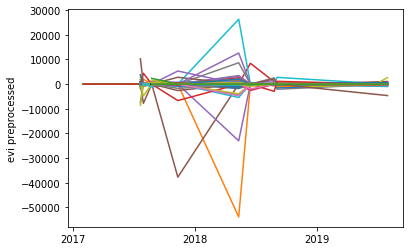

In [236]:
t_start = time.time()

time_series = ray.get(get_ts_mb_distributed.remote(*bboxes[200]))
plot_time_series(time_series, 'evi')

duration = time.time() - t_start
print(f'{duration} seconds')

In [237]:
len(time_series.keys())

10243

In [281]:
t_start = time.time()

means = ray.get(get_and_process_ts_mb_distributed.remote(*bboxes[200]))


duration = time.time() - t_start
print(f'{duration} seconds')

(pid=14650) https://oceanworks.jpl.nasa.gov/datainboundsmb?ds=hls.preprocessed-m2-01&b=-71.80004325448435,43.18396159820855,-71.76141969483798,43.15553049624724&startTime=2017-01-01T00:00:00Z&endTime=2019-12-31T00:00:00Z
(pid=14650) .
(pid=14650) <Response [200]>
44.74704194068909 seconds


In [239]:
len(means.keys())

10243

In [284]:
m = mgrs.MGRS()
grid_points = []
measurements = {}
for k, values in means.items():
    lat, lon = m.toLatLon(k)
    grid_points.append([lat, lon]) 
    for var, value in values.items():
        if var not in measurements:
            measurements[var] = []
        measurements[var].append(value)
    

(array([1.0000e+00, 0.0000e+00, 1.0000e+00, 1.0000e+00, 0.0000e+00,
        2.0000e+00, 1.0082e+04, 1.5100e+02, 4.0000e+00, 1.0000e+00]),
 array([-6749.4457378 , -5781.9791476 , -4814.51255739, -3847.04596718,
        -2879.57937698, -1912.11278677,  -944.64619656,    22.82039364,
          990.28698385,  1957.75357406,  2925.22016426]),
 <a list of 10 Patch objects>)

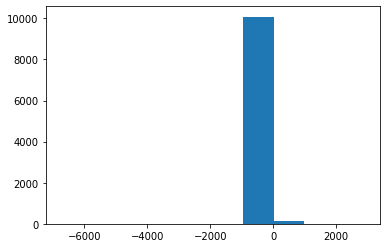

In [263]:
plt.hist(measurements['evi'])

array([[ 43.15567714,  43.15603691,  43.15570146, ...,  43.17497897,
         43.17498792,  43.16603192],
       [-71.77451275, -71.77452904, -71.7772196 , ..., -71.77686343,
        -71.77649476, -71.7707994 ]])

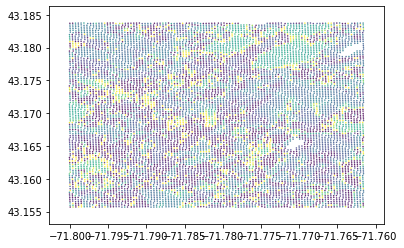

In [286]:
lat_lon = np.transpose(grid_points)
plt.scatter(lat_lon[1], lat_lon[0], s=0.2, c=measurements['evi'], vmin=-3, vmax=3)

lat_lon

In [154]:
m.toMGRS(lat,lon, MGRSPrecision=4)


'18TYN00009727'

In [183]:
sorted(evi_points[1])

[-72.53490572156562,
 -72.53490467801427,
 -72.53490363441416,
 -72.53490259076533,
 -72.53490154706775,
 -72.53490050332145,
 -72.53489945952643,
 -72.53489841568266,
 -72.53489773543879,
 -72.5348966914942,
 -72.5348954909316,
 -72.53489444753406,
 -72.53452559955355,
 -72.5345254141442,
 -72.53452522027494,
 -72.53452455785029,
 -72.53452417986153,
 -72.53452351609828,
 -72.53452313939934,
 -72.5345224742975,
 -72.53452246270248,
 -72.53452143244799,
 -72.53452142213938,
 -72.53452039054969,
 -72.53452038152751,
 -72.53451934860263,
 -72.53451934086686,
 -72.53451914244953,
 -72.53451830660684,
 -72.53451830015746,
 -72.53451810238512,
 -72.53451726456228,
 -72.5345172593993,
 -72.53451706227193,
 -72.53451658617733,
 -72.53451621859234,
 -72.53451602210998,
 -72.53451554403188,
 -72.53451517773665,
 -72.53451498189926,
 -72.53451450183766,
 -72.53451413683219,
 -72.53451394163977,
 -72.5341459897583,
 -72.53414585958373,
 -72.53414566969226,
 -72.53414547039256,
 -72.53414526263012

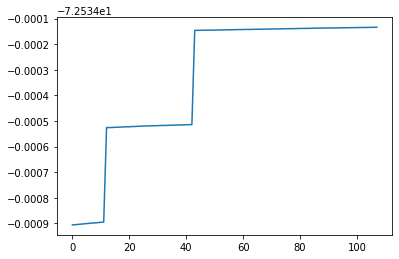

In [182]:
plt.plot(sorted(evi_points[1]))